# Свёрточные сети

Сегодня мы детальнее поговорим про общие подходы при обучении нейросетей, и что происходит внутри них.

<img width='400px' src='https://raw.githubusercontent.com/sslotin/universum-dl/43390d26d5f256dcc68a6ba51998bd626b3f6d33/images/cat.png'>

Если попытаться визуализировать то, что выучивает каждый нейрон в нейросети (например, посмотрев, какие входные пиксели на него сильнее всего влияют), то можно увидеть, что чем глубже находится слой, тем более абстрактные фичи он содержит.

Например, в сетях для распознавания картинок первые слои учатся обнаруживать геометрические примитивы: линии, границы, углы. Следующий слой может распознавать простые геометрические фигуры. Следующий распознаёт наличие целых объектов и т. д.

**Weight sharing**. [Эксперименты с дропаутом](https://arxiv.org/abs/1701.05369) показывают, что в линейном слое примерно 99% весов на самом деле можно выкинуть. Логично, что в оптимальной архитектуре не должно быть бесполезных весов — лишние параметры всегда ведут к переобучению. В случае с картинками решение в том, чтобы использовать информацию о расположении пикселей относительно друг друга.

## Свёртки и пуллинги

**Как хранятся картинки**. Когда говорят «изображение», представляйте не прямоугольник, а параллелепипед, высотой которого будет размер каналов. Например, обычные цветные RGB картинки имеют 3 канала: на красный (R), зелёный (G) и синий (B).

0. Введем такую функцию, как **ядро** (англ. **kernel**) — она считает скалярное произведение вектора-входа со своим вектором-параметром.
1. Разобьем исходный паралеллелепипед на сколько-то параллелепипедов одинакового размера вдоль размерности, соответствующей каналам. Они могут пересекаться.
2. Каждый из них «разгладим» в вектор.
3. К кажому такому вектору и применим по очереди каждый кернел (их обычно берут много разных).
4. Положим то, что получилось, в новый параллелепипед.
5. Посчитаем для кажой ячейки какую-нибудь нелинейность. Обычно это ReLU из-за вычислительных причин.

<img width='350px' src='https://raw.githubusercontent.com/sslotin/universum-dl/43390d26d5f256dcc68a6ba51998bd626b3f6d33/images/conv1.png'>

Эта операция называется **свёрткой**. Помимо кернела, в ней есть другие параметры — паддинг (отступ по краям), страйды (шаги по x и y). Также свёртка может быть в 2d и 3d. Посмотрите этот репозиторий, чтобы получше разобраться со свёрточной арифметикой: https://github.com/vdumoulin/conv_arithmetic

![](http://deeplearning.net/software/theano/_images/numerical_padding_strides.gif)

**Пулингом** называют операцию, при которой входной тензор так же разбивается на квадраты (не паралепипеды — операция независима по каждому каналу) и на каждом квадрате считается какая-нибудь редукция (чаще всего максимум или среднее по всем значениям в квадрате), после чего полученные значения записываются на следующий слой в том же порядке.

<img width='400px' src='http://cs231n.github.io/assets/cnn/maxpool.jpeg'>

В свёртках переиспользуется очень много параметров: кернел для каждого фильтра (выходного канала) использует один и тот же вектор-параметр для скалярного умножения. Из-за этого каждый фильтр как правило выучивает какую-то конкретную фичу, вроде наличия какого-либо объекта на своём регионе. Пулинг используют затем для понижения размерности: каждый нейрон после свертки выражает степень уверенности, что на регионе присутствует какой-то объект, и поэтому логично в качестве вероятности наличия объекта на регионе из под-регионов использовать максимум или среднее.

Чаще всего используют свёртки 3x3 со страйдом 2x2 (то есть квадраты перекрываются по 3 крайним пикселям) с пулингом размера 2x2 (не перекрываются).

## Аугментация данных

Аугментацией называется процесс получения новых синтетических данных из имеющихся, чтобы подать в обучение. Это часто (особенно в компьютерном зрении) позволяет улучшить качество модели, не используя дополнительных данных.

Формально, в случае с классификацией, аугментация — это любое преобразование, которое корректно изменяет данные, не меняя их класс.

В случае с картинками, можно попробовать добавить следующие преобразования, которые с какой-то вероятностью будут использоваться во время обучения:

* Поворот на малый угол.
* Добавление шума.
* Обрезание границ и последующее растяжение до исходного размера.
* Горизонтальное отражение (но в нашем случае оно вредно).
* Смещение на небольшое расстояние.

Понятно, что лейбл эти преобразования изменить не должны.

<img src='https://ai2-s2-public.s3.amazonaws.com/figures/2017-08-08/a5da2c3b4174449d13dd746b7d00897c6bc1f334/5-Figure2-1.png' width='500px'>

## Взрывающийся градиент

В сетях происходит очень много чего стохастического: батч формируется случайно, аугментация, рандомизированные слои вроде дропаута, вычислительные ошибки. Это всё может привести к тому, что сеть на какой-то итерации будет очень уверенна в неправильном предсказании и некоторые её параметры получат очень большой градиент. Это может привести к тому, что эти параметры «улетят» куда-то настолько далеко, и после этого сеть будет всегда предсказывать класс, который на этой итерации был правильным. 

Простое решение: просто обрезать градиент в случае, если градиент больше какого-то фиксированного значения. Для этого есть функция `torch.nn.utils.clip_grad_norm_`, которая принимает параметры модели и параметр `threshold`. Она считает норму (длину вектора) градиента и, если она больше `threshold`, нормирует градиенты так, чтобы она была равна `threshold`. Эта функция также возвращает само значение нормы, что может быть очень полезно при анализе обучения (например, если она становится маленькой, то, значит, сеть сходится к какому-то плато).

## Инициализация параметров

Сначала приведем пример плохой инициализации. Пусть мы задали все значения изначально нулями. В таком случае наша модель становится эквивалентна линейной модели — производная по функции потерь одинакова для каждого $w_i$, таким образом, все веса имеют одинаковые значения и в последующей итерации, что делает нейроны в сети симметричными.

Подход получше — инициализировать каждый вес случайно. Но тут нужно быть осторожным — если задать их слишком большими, то сеть может быть изначально очень уверенна в своих предсказаниях, и подвинуть параметры оттуда будет очень трудно.

Решение следующее. С точки зрения слоя, ему на вход подается сэмпл из какого-то распределения, и он под это распределение подстраивается. В нейросетях размеры слоев достаточно большие, чтобы в них работали законы статистики, все разработчики фреймворках условились инициализировать веса всех слоев в предположении, что на вход подаются данные из какого-то распределения со средним 0 и дисперсией 1, и на выходе должно получиться какое-то распределение со средним тоже 0 и дисперсией 1. Чаще всего изначальные веса берут либо из нормального, либо из равномерного распределения, «обрезанного» так, чтобы дисперсия каждого выходного значения получилась единичной.

Аналогично нужно поступать со входными векторными данными: нормализовывать. Это будет важно при работе с изображениями: не надо подавать на вход вектора с элементами от 0 до 255. Самое простое рабочее решение — нормализовать вход, поделив его на 255.

## Минутка физики

Потребляемая энергия в сети с переменным током в единицу времени считается по формуле

$$W = CV^2f$$

где $C$ означает емкость сети, $V$ означает напряжение, а $f$ — частоту. В случае с процессорами, это именно та частота, с которой выполняются элементарные операции, например сложение.

<img width='350px' src='https://i.ibb.co/yhsGRJK/Screenshot-from-2019-02-08-14-52-07.png'>

Однако, если мы сделаем сеть из двух параллельно подключенных процессоров, работающих на половинной частоте, мы можем получить сеть, потребляющую ~40% изначальной энергии, делающую то же количество полезной работы — то же суммарное количество процессорных тактов:

<img width='450px' src='https://i.ibb.co/WgLCxxL/Screenshot-from-2019-02-08-14-52-18.png'>

Поэтому для хорошо распараллеливаемых операций используют другой тип вычислительных устройств, в которых не 4-8 быстрых (3-4 GHz) процессоров, а несколько тысяч медленных (~1GHz).

## Device-agnostic код

К любой модели или тензору в PyTorch можно применить `.cuda()` и `.cpu()`, чтобы перевести тензор на память GPU или в оперативную память соответственно. Но если мы будем писать такой код, нам будет довольно проблематично портировать его на другие машины, где, например, нет GPU (например, если вы хотите скачать тетрадку с colab к себе и запустить).

Многие фреймворки позволяют абстрагироваться от устройства конкретных вычислительных устройств. В PyTorch для этого есть объект `torch.device`, который позволяет явно задавать, на каком устройстве хранить тензор или модель.

In [1]:
import torch
import torch.nn as nn

device = torch.device('cuda:0')  # используй первую GPU (номеруются с нуля)

X = torch.randn(5, 100, device=device)  # создай матрицу на этом устройстве
# альтернативно: X = X.to(device)

# создадим какую-нибудь модель
model = nn.Sequential(
    nn.Linear(100, 20),
    nn.ReLU(),
    nn.Linear(20, 8)
)

model = model.to(device)  # переведи параметры модели на это устройство

model(X)

tensor([[-0.1920,  0.1444, -0.1385,  0.1680, -0.1388, -0.2356,  0.0259, -0.0457],
        [-0.0164,  0.0594,  0.3284,  0.4426, -0.1646, -0.0944, -0.3536,  0.1598],
        [-0.3986,  0.1814,  0.1681,  0.1704, -0.0271, -0.1103, -0.1467,  0.2183],
        [-0.0417, -0.2025, -0.0619,  0.4325, -0.3356,  0.1361, -0.2013, -0.0383],
        [-0.2039,  0.0718, -0.0831,  0.0812, -0.3167, -0.0208,  0.2497, -0.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

# Колоризация изображений

Начнём практическую часть. Обучим autoencoder-like сеть, которая учится восстанавливать изображение по его черно-белой версии. В качестве лосса будем так же использовать какую-нибудь меру расстояния между изображениями (например, l1 или l2).

Тот пайплайн, что у нас получится, с минимальными изменениями можно будет также использовать и для других подобных задач, связанных с восстановлением изображений после каких-либо необратимых преобразований, например после подмешивании шума (denoising autoencoder) или понижения размера (DeepHD).

![](https://camo.githubusercontent.com/c5f95c94d70a3e52561c1d0591e84a5e3b86eb74/687474703a2f2f726963687a68616e672e6769746875622e696f2f636f6c6f72697a6174696f6e2f7265736f75726365732f696d616765732f6e65745f6469616772616d2e6a7067)

In [2]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

Для начала скачаем данные. Годятся вообще любые изображения, не обязательно из какого-то изветсного датасета. Этой командой можно скачать и распакавать фотографии с одной школы по программированию, проходившей этим летом.

In [ ]:
!wget http://sereja.me/f/universum_compressed.tar
!tar xf universum_compressed.tar

--2022-03-21 12:48:48--  http://sereja.me/f/universum_compressed.tar
Resolving sereja.me (sereja.me)... 213.159.215.132
Connecting to sereja.me (sereja.me)|213.159.215.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72028160 (69M) [application/x-tar]
Saving to: ‘universum_compressed.tar’

universum_compresse 100%[===================>]  68.69M  4.39MB/s    in 20s     

2022-03-21 12:49:08 (3.49 MB/s) - ‘universum_compressed.tar’ saved [72028160/72028160]



Есть два подхода к работе с данными:

1. Сначала преобразовать все имеющиеся данные к виду, который принимает нейросеть (сразу к тензорам одинакового размера).
2. Хранить сырые данные и преобразование препроцессинга (функцию) и собирать батчи на лету.

Если это не что-то совсем простое, то второй вариант предпочтительнее, так как он не требует дополнительной памяти (датасеты могут быть большими), времени на векторизацию датасета, а так же сбор батча «на лету» позволяет там же делать аугментацию.

Для этого в PyTorch есть две абстракции: `Dataset` и `DataLoader`.

`Dataset` — абстрактный класс, от которого нужно отнаследовать класс датасета, который мы напишем. В нём должны быть определён конструктор (в нём обычно загружаются в память сырые данные, которые лежат где-то на диске, а также сохраняется какая-нибудь другая информация), метод `__len__` (должен вернуть размер датасета) и `__getitem__`, который должен по номеру сэмпла вернуть его в виде тензора (возможно, произведя какой-нибудь препроцессинг).

In [3]:
# tqdm -- это маленькая библиотечка для прорисовывания progress bar-ов прямо в питоне

from tqdm import tqdm
from time import sleep

for i in tqdm(range(10)):
    sleep(0.5)

100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


In [4]:
import os
from PIL import Image

class ColorizationDataset(Dataset):
    def __init__(self, path, transform_x, transform_y):
        self.transform_x = transform_x
        self.transform_y = transform_y
      
        filenames = []
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.jpg') or file.endswith('.JPG'):
                    filenames.append(os.path.join(root, file))

        self.images = []
        for filename in tqdm(filenames):
            try:
                with Image.open(filename) as image:
                    self.images.append(image.copy())
            except:
                pass
                #print('Could not load image:', filename)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        Y = self.transform_y(img)
        X = self.transform_x(Y)
        return X, Y

Чтобы подавать картинки на вход нейросети, нужно их перевести в тензоры, причём одинакового размера.

In [5]:
transform_all = transforms.Compose([
    # вырежем случайный квадратик
    transforms.RandomResizedCrop(128),
    # горизонтально перевернем -- изображение останется валидным
    transforms.RandomHorizontalFlip(),
    # что бы ещё поделать, чтобы увеличить размер датасета?
    # ...
    transforms.ToTensor(),
])

def to_grayscale(x):
    return 1 - (x[0] * 0.299 + x[1] * 0.587 + x[2] * 0.114).view(1, 128, 128)
    # минутка эволюционной биологии: как вы думаете, почему коэффициенты именно такие?

Здесь `transform_all` и `to_grayscale` являются функциями (формально, первый является функтором), которые мы передадим дальше в `DataLoader`, который оборачивает датасет и позволяет итерироваться по нему по батчам, а также реализует разные полезные функции вроде перемешивания данных после каждой эпохи.

In [6]:
dataset = ColorizationDataset('universum-photos', to_grayscale, transform_all)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

100%|██████████| 1254/1254 [00:00<00:00, 1260.29it/s]


**Skip-connection**. Иногда бывает полезно присоединить к выходу какого-то слоя его вход, чтобы следующий получил такую же, неизменённую копию. Здесь мы поступим именно так: подадим исходное черно-белое изображение в какую-то одну часть сети, которая сконцентрируется на определении цвета, а затем припишем последним слоем её выход и отправим дальше другому модулю, который уже раскрасит это исходное изображение. От простоты `nn.Sequential`, правда, уже придётся отказаться, и нужно написать свой класс.

In [7]:
def Block(channels_in, channels_out, stride_size=1, dilation_size = 1, padding_size = 1):
    return nn.Sequential(
        nn.Conv2d(channels_in, channels_out, kernel_size = 3, stride=stride_size, dilation=dilation_size, padding=padding_size),
        # nn.MaxPool2d(),
        # nn.Dropout(),
        nn.ReLU(),
        # nn.BatchNorm(),
    )

In [8]:
from torch.nn.modules.batchnorm import BatchNorm2d
class Colorizer(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.preconcat = nn.Sequential(
            Block(1, 64), # 1, 128, 128
            Block(64, 64, stride_size=2), # 64, 128, 128
            nn.BatchNorm2d(64), # 64, 64, 64

            Block(64, 128), #64, 64, 64
            Block(128, 128, stride_size=2), #128, 64, 64
            nn.BatchNorm2d(128), # 128, 32, 32

            Block(128, 256), # 128, 32, 32
      
            Block(256, 256, stride_size=2), # 256, 32, 32
            nn.BatchNorm2d(256), # 256, 16, 16

            Block(256, 512), # 256, 16, 16
            
            Block(512, 512), # 512, 16, 16
            nn.BatchNorm2d(512),

            Block(512, 512, dilation_size=2, padding_size=2), #512, 16, 16
            nn.BatchNorm2d(512),

            Block(512, 512, dilation_size=2, padding_size=2),  #512, 16, 16
            nn.BatchNorm2d(512),

            Block(512, 512), #512, 16, 16
            nn.BatchNorm2d(512),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1), #512, 16, 16
            nn.ReLU(),
            Block(256, 256), #256, 32, 32

            nn.Upsample(scale_factor=2), # 256, 32, 32
            Block(256, 128), #256, 64, 64
            
            nn.Upsample(scale_factor=2), #128, 64, 64
            Block(128, 64) # 128, 128, 128
            # 64, 128, 128


        )
         
        self.postconcat = nn.Sequential(         # эту сетку можно особо не увеличивать - она не должна быть очень умной
            nn.Conv2d(65, 32, (3, 3), padding=1),# подумайте, откуда у автора тут 65
            nn.ReLU(),
            nn.Conv2d(32, 3, (3, 3), padding=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        h = self.preconcat(x)
        # исходное чб изображение -- просто дополнительным слоем
        h = torch.cat((h, x), 1)
        h = self.postconcat(h)
        return h

In [9]:
x = dataset[0][0].view(1, 1, 128, 128).to(device)
model = Colorizer().to(device)
model(x)

tensor([[[[0.5019, 0.5020, 0.4990,  ..., 0.5037, 0.5042, 0.5035],
          [0.4995, 0.5044, 0.5044,  ..., 0.5051, 0.5054, 0.5051],
          [0.5010, 0.5044, 0.5031,  ..., 0.5056, 0.5060, 0.5056],
          ...,
          [0.5008, 0.5038, 0.5038,  ..., 0.5041, 0.5032, 0.5067],
          [0.5009, 0.5071, 0.5066,  ..., 0.5061, 0.5054, 0.5080],
          [0.5000, 0.5013, 0.5033,  ..., 0.5032, 0.5027, 0.5074]],

         [[0.5095, 0.5104, 0.5110,  ..., 0.5117, 0.5122, 0.5120],
          [0.5135, 0.5131, 0.5135,  ..., 0.5131, 0.5139, 0.5144],
          [0.5137, 0.5118, 0.5112,  ..., 0.5124, 0.5133, 0.5131],
          ...,
          [0.5138, 0.5129, 0.5116,  ..., 0.5120, 0.5132, 0.5095],
          [0.5168, 0.5145, 0.5132,  ..., 0.5139, 0.5149, 0.5105],
          [0.5196, 0.5167, 0.5159,  ..., 0.5164, 0.5174, 0.5123]],

         [[0.5130, 0.5141, 0.5129,  ..., 0.5141, 0.5146, 0.5138],
          [0.5150, 0.5185, 0.5191,  ..., 0.5163, 0.5166, 0.5152],
          [0.5140, 0.5181, 0.5191,  ..., 0

Глубокие сети очень часто состоят из повторяющихся блоков, отличающихся только размерностью (в данном случае — количеством фильтров). Чтобы сократить количество кода и уменьшить вероятность багов, блоки можно обернуть в одну функцию, возвращающую мини-модель из нескольких слоев.

Концептуальный пример:

Дальше как обычно:

In [10]:
num_epochs = 1501
lr = 1e-3

model = Colorizer().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.L1Loss()  # тут можно поиграться с лоссами

In [11]:
id = [209, 188, 71]

0.017092160880565643 1000


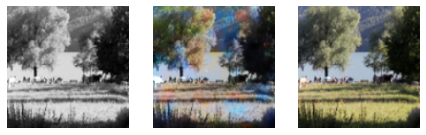

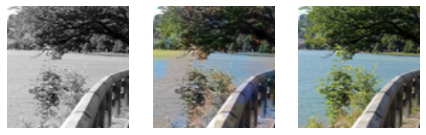

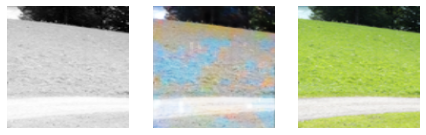

0.01636217162013054 1001
0.018823103979229927 1002
0.0196378156542778 1003
0.017471224069595337 1004
0.018668033182621002 1005
0.019486138597130775 1006
0.01799415796995163 1007
0.01762467809021473 1008
0.01879202201962471 1009
0.01778942346572876 1010


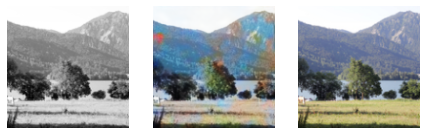

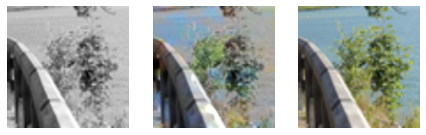

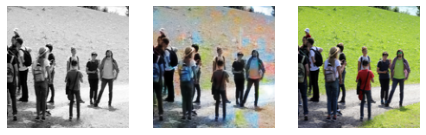

0.01769721321761608 1011
0.01872299052774906 1012
0.01933114603161812 1013
0.017173755913972855 1014
0.0180963221937418 1015
0.018265847116708755 1016
0.020337793976068497 1017
0.018921691924333572 1018
0.01951613463461399 1019
0.018767736852169037 1020


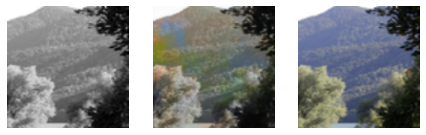

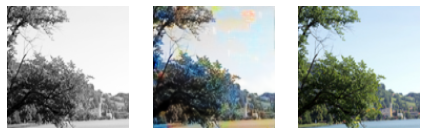

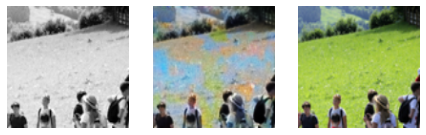

0.018561460077762604 1021
0.017214294523000717 1022
0.017031779512763023 1023
0.018931422382593155 1024
0.01733621396124363 1025
0.01920950599014759 1026
0.018323669210076332 1027
0.018125634640455246 1028
0.021196112036705017 1029
0.017623618245124817 1030


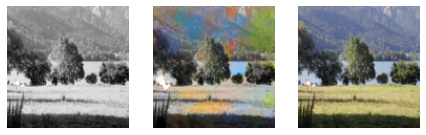

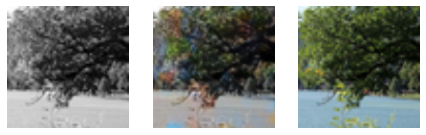

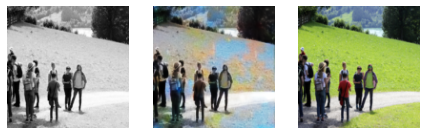

0.01768556982278824 1031
0.018066972494125366 1032
0.016833968460559845 1033
0.01820712350308895 1034
0.017929350957274437 1035
0.018070872873067856 1036
0.017638126388192177 1037
0.018470341339707375 1038
0.017087697982788086 1039
0.01639441028237343 1040


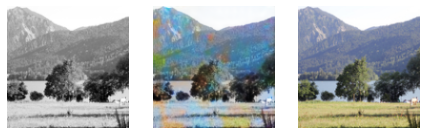

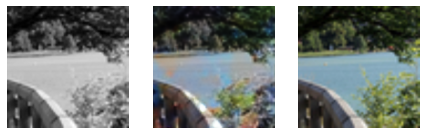

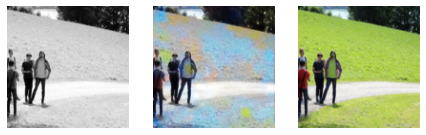

0.019219839945435524 1041
0.019693877547979355 1042
0.018797991797327995 1043
0.017511164769530296 1044
0.01910317875444889 1045
0.018262339755892754 1046
0.0177475493401289 1047
0.019731920212507248 1048
0.018639713525772095 1049
0.017956743016839027 1050


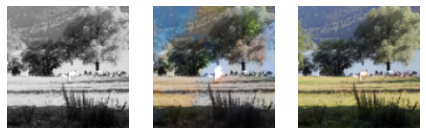

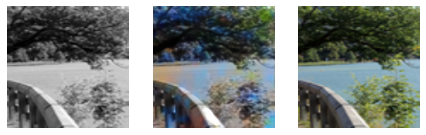

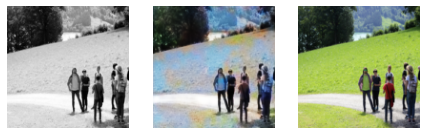

0.019045285880565643 1051
0.018297826871275902 1052
0.017999231815338135 1053
0.019293656572699547 1054
0.017899954691529274 1055
0.019017556682229042 1056
0.019031209871172905 1057
0.019185781478881836 1058
0.017010191455483437 1059
0.017243601381778717 1060


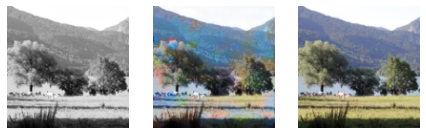

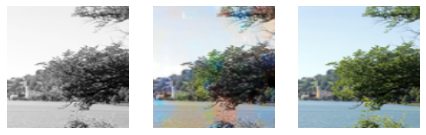

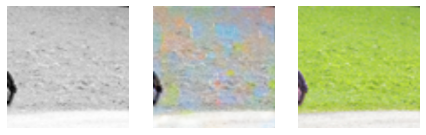

0.016812847927212715 1061
0.017882291227579117 1062
0.01796739362180233 1063
0.019107816740870476 1064
0.016291284933686256 1065
0.019003931432962418 1066
0.017209772020578384 1067
0.017707284539937973 1068
0.0188459400087595 1069
0.01766939088702202 1070


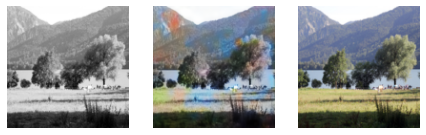

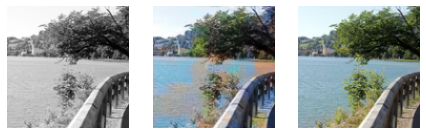

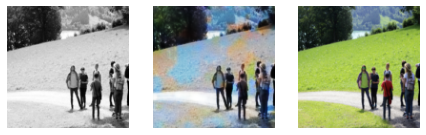

0.018642505630850792 1071
0.01713620312511921 1072
0.01697222888469696 1073
0.018019115552306175 1074
0.017422204837203026 1075
0.0187839325517416 1076
0.01679692417383194 1077
0.01931476593017578 1078
0.019802838563919067 1079
0.0186469666659832 1080


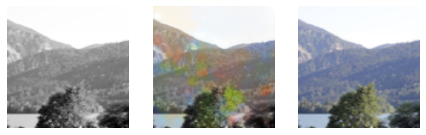

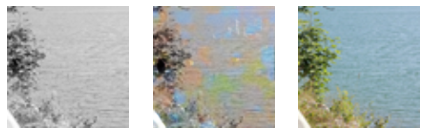

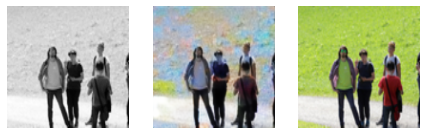

0.019823571667075157 1081
0.01672123745083809 1082
0.01737056113779545 1083
0.01767248846590519 1084
0.018122853711247444 1085
0.01798834279179573 1086
0.019293731078505516 1087
0.016693104058504105 1088
0.016633110120892525 1089
0.0174711886793375 1090


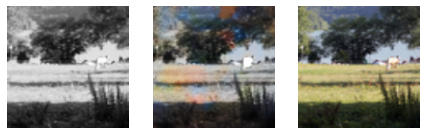

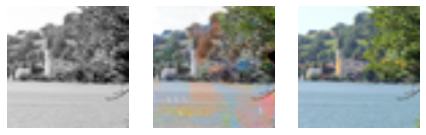

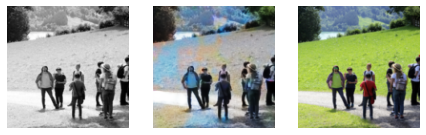

0.017579590901732445 1091
0.019595986232161522 1092
0.017736991867423058 1093
0.01940063387155533 1094
0.017481600865721703 1095
0.01847011223435402 1096
0.017322028055787086 1097
0.017647942528128624 1098
0.01721261814236641 1099
0.01760156825184822 1100


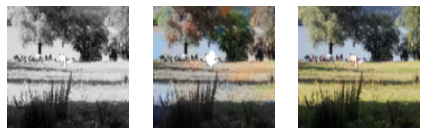

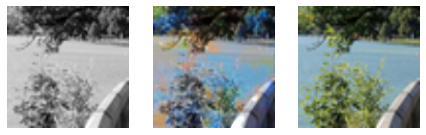

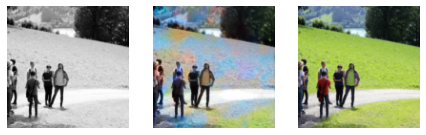

0.016378113999962807 1101
0.016983309760689735 1102
0.01756950654089451 1103
0.01798361726105213 1104
0.018533887341618538 1105
0.01742158830165863 1106
0.017286494374275208 1107
0.017744876444339752 1108
0.017283182591199875 1109
0.017861278727650642 1110


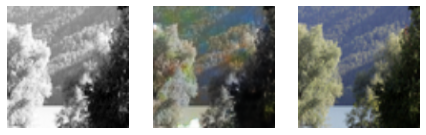

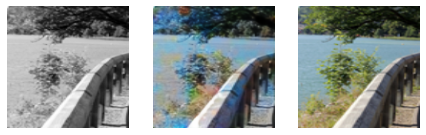

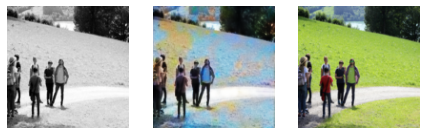

0.01690034754574299 1111
0.01858668215572834 1112
0.01816888526082039 1113
0.01599271595478058 1114
0.017149338498711586 1115
0.01658807508647442 1116
0.016553422436118126 1117
0.01883952133357525 1118
0.017616311088204384 1119
0.019295280799269676 1120


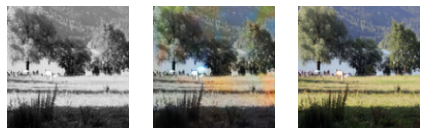

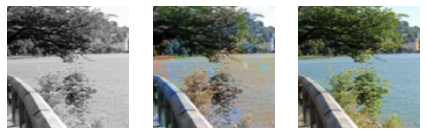

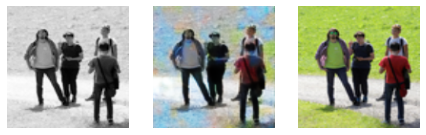

0.018238408491015434 1121
0.01792425476014614 1122
0.019023045897483826 1123
0.017034512013196945 1124
0.017341962084174156 1125
0.018623508512973785 1126
0.01692529395222664 1127
0.017936736345291138 1128
0.01921025477349758 1129
0.01707194373011589 1130


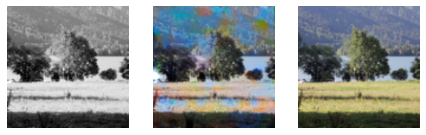

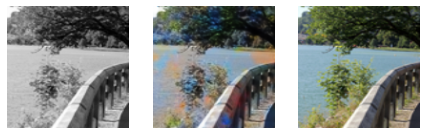

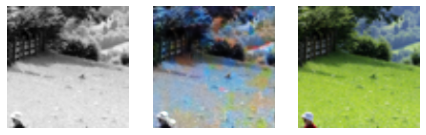

0.01649358496069908 1131
0.018400095403194427 1132
0.018911918625235558 1133
0.018868958577513695 1134
0.018062030896544456 1135
0.016422880813479424 1136
0.01768425665795803 1137
0.018686771392822266 1138
0.018260382115840912 1139
0.01771894469857216 1140


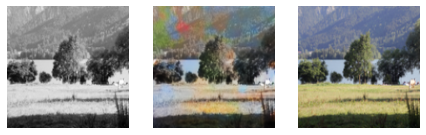

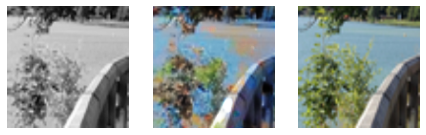

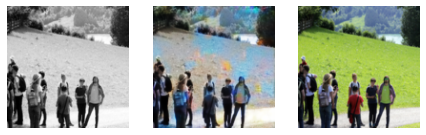

0.017229726538062096 1141
0.018356693908572197 1142
0.017482373863458633 1143
0.018592005595564842 1144
0.017405018210411072 1145
0.01621958054602146 1146
0.016333838924765587 1147
0.01704644039273262 1148
0.016039304435253143 1149
0.01760045811533928 1150


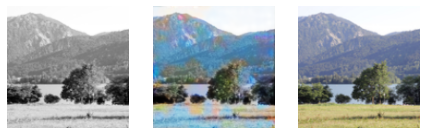

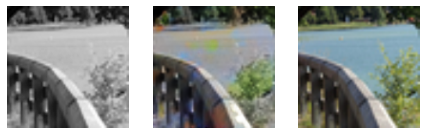

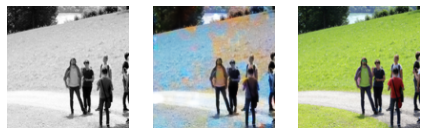

0.017228655517101288 1151
0.016903921961784363 1152
0.016227757558226585 1153
0.01852360926568508 1154
0.01578047126531601 1155
0.018570732325315475 1156
0.01652032695710659 1157
0.01644805818796158 1158
0.018429158255457878 1159
0.019027961418032646 1160


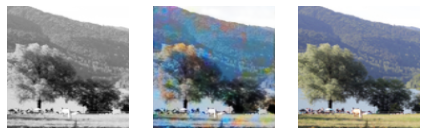

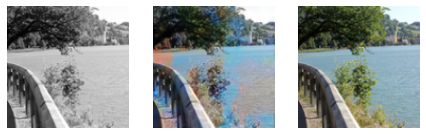

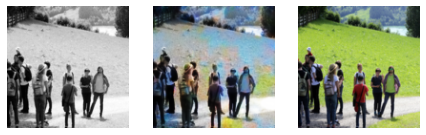

0.020084766671061516 1161
0.016084840521216393 1162
0.017323153093457222 1163
0.01760459691286087 1164
0.01789616420865059 1165
0.01790548861026764 1166
0.01836850307881832 1167
0.01856740191578865 1168
0.017405912280082703 1169
0.017823420464992523 1170


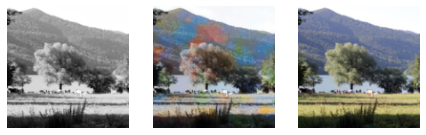

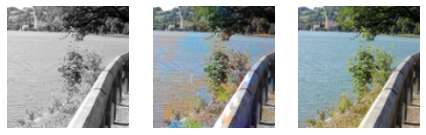

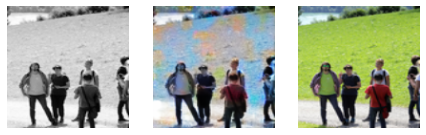

0.016224438324570656 1171
0.015407824888825417 1172
0.016738323494791985 1173
0.016575396060943604 1174
0.01593521423637867 1175
0.016784433275461197 1176
0.016394570469856262 1177
0.017202366143465042 1178
0.015778865665197372 1179
0.016258010640740395 1180


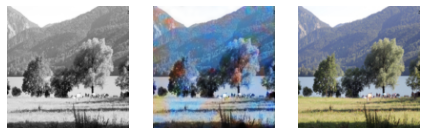

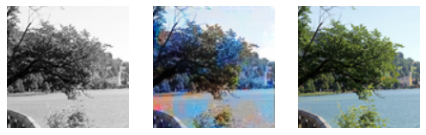

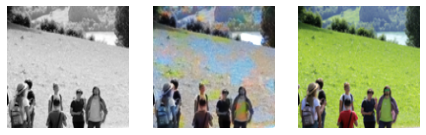

0.017726585268974304 1181
0.01745525561273098 1182
0.01780848018825054 1183
0.017189880833029747 1184
0.016936706379055977 1185
0.01851101964712143 1186
0.01818251609802246 1187
0.01781105436384678 1188
0.016767874360084534 1189
0.016098886728286743 1190


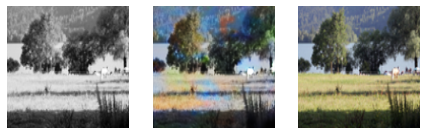

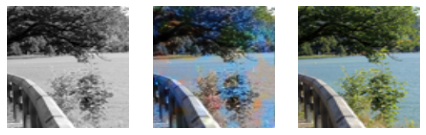

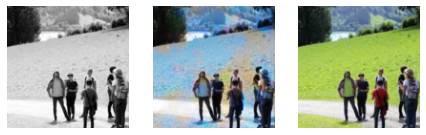

0.01628555729985237 1191
0.01597682386636734 1192
0.01822614297270775 1193
0.016617529094219208 1194
0.016839252784848213 1195
0.016339275985956192 1196
0.01632792316377163 1197
0.017568981274962425 1198
0.017249036580324173 1199
0.017017994076013565 1200


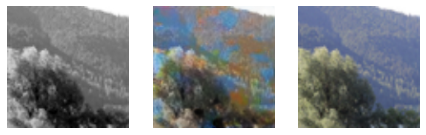

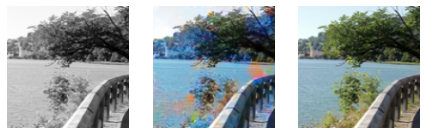

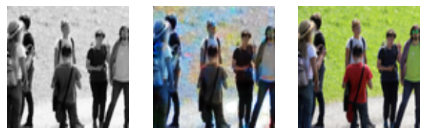

0.01779504120349884 1201
0.016314063221216202 1202
0.01945500820875168 1203
0.018472308292984962 1204
0.01772220805287361 1205
0.017083346843719482 1206
0.016591034829616547 1207
0.016454152762889862 1208
0.0164822768419981 1209
0.017745086923241615 1210


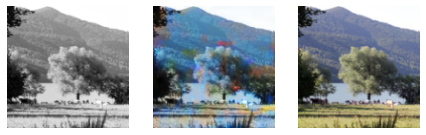

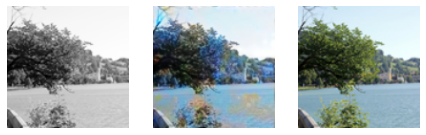

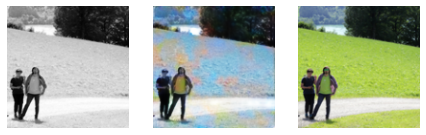

0.01677764020860195 1211
0.016515037044882774 1212
0.01740839146077633 1213
0.018149731680750847 1214
0.016354626044631004 1215
0.017377465963363647 1216
0.015684593468904495 1217
0.018418705090880394 1218
0.01641690544784069 1219
0.016346771270036697 1220


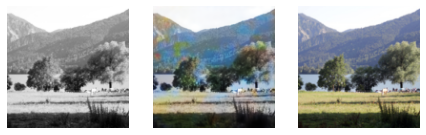

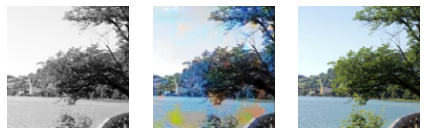

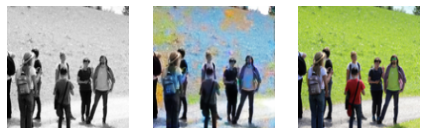

0.016581358388066292 1221
0.015622619539499283 1222
0.01763552613556385 1223
0.017893867567181587 1224
0.017344361171126366 1225
0.01692032255232334 1226
0.01846691220998764 1227
0.0168433990329504 1228
0.017007088288664818 1229
0.016973555088043213 1230


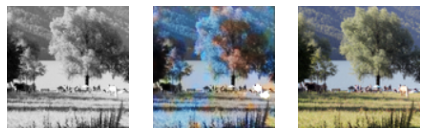

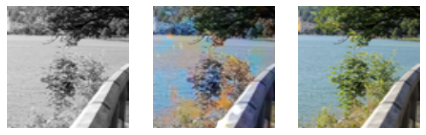

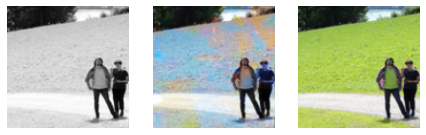

0.01611318625509739 1231
0.016719631850719452 1232
0.017724331468343735 1233
0.01632329449057579 1234
0.017138395458459854 1235
0.017435498535633087 1236
0.018050149083137512 1237
0.01882432959973812 1238
0.01699197106063366 1239
0.015645919367671013 1240


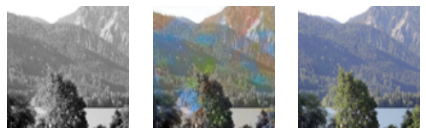

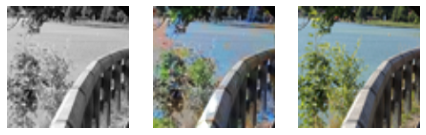

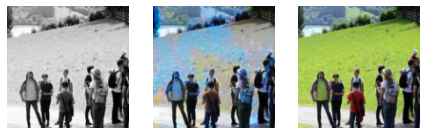

0.01718757674098015 1241
0.017809636890888214 1242
0.017934655770659447 1243
0.01713867299258709 1244
0.01740681752562523 1245
0.016575265675783157 1246
0.01747983880341053 1247
0.016713399440050125 1248
0.01660466566681862 1249
0.017205214127898216 1250


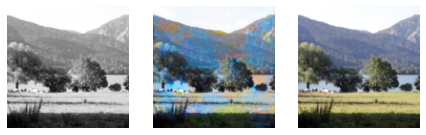

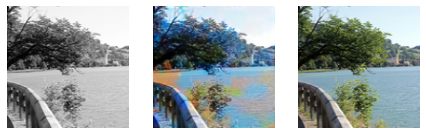

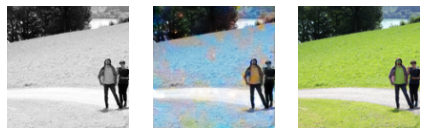

0.01704486645758152 1251
0.01652379333972931 1252
0.01769106835126877 1253
0.01678343303501606 1254
0.015987513586878777 1255
0.01806240901350975 1256
0.01836613193154335 1257
0.018531737849116325 1258
0.016541017219424248 1259
0.01613221876323223 1260


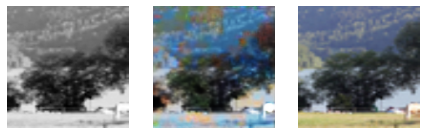

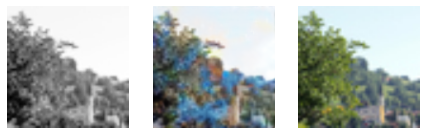

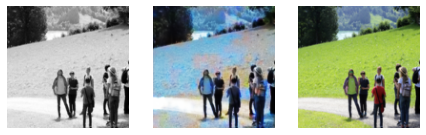

0.016340961679816246 1261
0.017426690086722374 1262
0.017566027119755745 1263
0.018533648923039436 1264
0.017133845016360283 1265
0.0176436435431242 1266
0.018676070496439934 1267
0.02070518396794796 1268
0.016161635518074036 1269
0.01671449840068817 1270


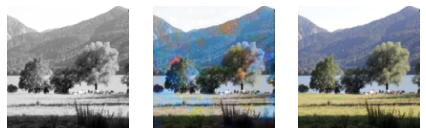

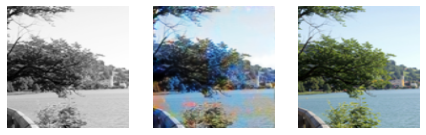

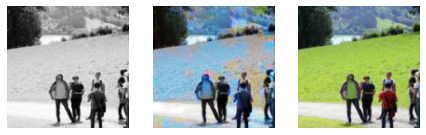

0.017537934705615044 1271
0.0165400393307209 1272
0.017380928620696068 1273
0.016458651050925255 1274
0.017544321715831757 1275
0.015917977318167686 1276
0.017101047560572624 1277
0.01639598421752453 1278
0.01651020348072052 1279
0.017278356477618217 1280


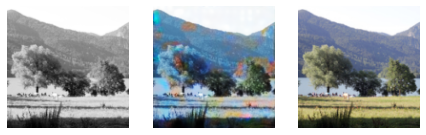

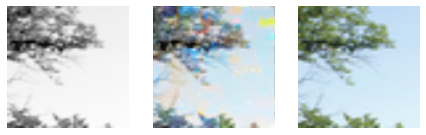

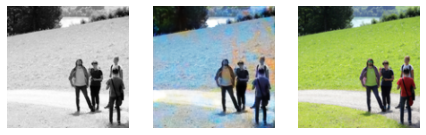

0.01687741093337536 1281
0.017168300226330757 1282
0.016430169343948364 1283
0.016529304906725883 1284
0.01664501056075096 1285
0.018423037603497505 1286
0.018520424142479897 1287
0.016941500827670097 1288
0.01810089312493801 1289
0.01681661047041416 1290


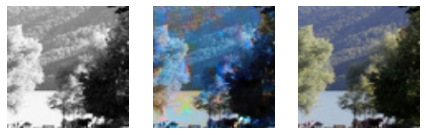

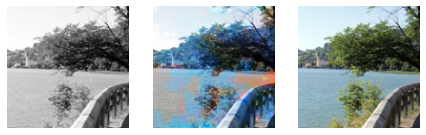

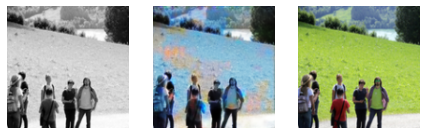

0.016481149941682816 1291
0.016140062361955643 1292
0.016711261123418808 1293
0.01561556663364172 1294
0.016780223697423935 1295
0.018086371943354607 1296
0.01657005585730076 1297
0.016113540157675743 1298
0.016741197556257248 1299
0.01611364260315895 1300


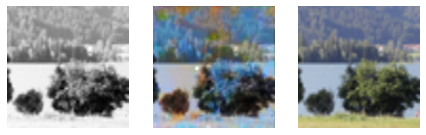

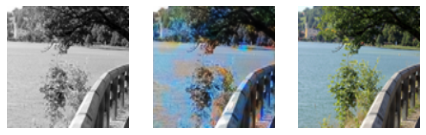

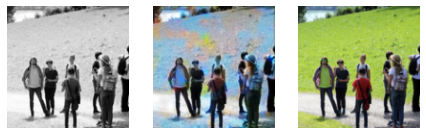

0.015542706474661827 1301
0.015945781022310257 1302
0.01612522453069687 1303
0.015638792887330055 1304
0.01637956127524376 1305
0.01542394794523716 1306
0.018389813601970673 1307
0.016424577683210373 1308
0.017185604199767113 1309
0.016446534544229507 1310


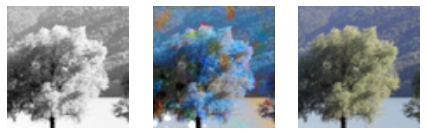

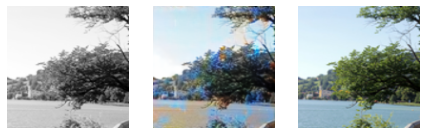

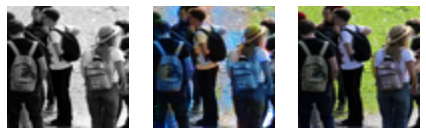

0.01646394282579422 1311
0.01720886118710041 1312
0.016099248081445694 1313
0.01704612374305725 1314
0.0162663534283638 1315
0.018225666135549545 1316
0.016946805641055107 1317
0.016524439677596092 1318
0.01816932111978531 1319
0.017800169065594673 1320


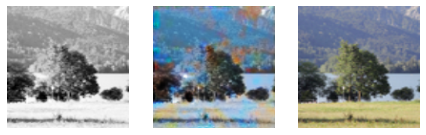

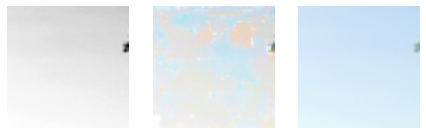

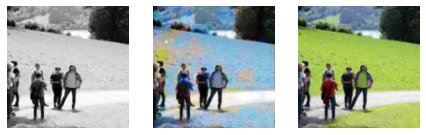

0.016317524015903473 1321
0.018724344670772552 1322
0.017676418647170067 1323
0.017611274495720863 1324
0.01728016696870327 1325
0.01645057462155819 1326
0.015686066821217537 1327
0.016507672145962715 1328
0.0164188165217638 1329
0.016177544370293617 1330


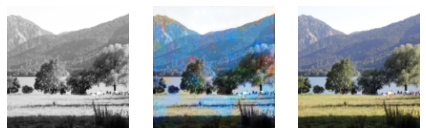

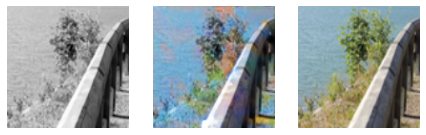

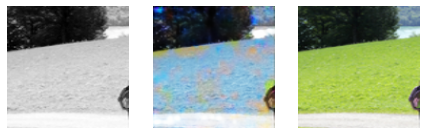

0.015954164788126945 1331
0.0147166159003973 1332
0.016331089660525322 1333
0.015805969014763832 1334
0.016645589843392372 1335
0.01653079316020012 1336
0.017599213868379593 1337
0.016763072460889816 1338
0.01633966527879238 1339
0.016070127487182617 1340


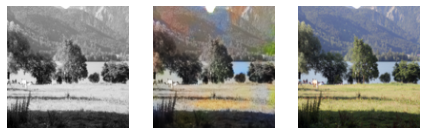

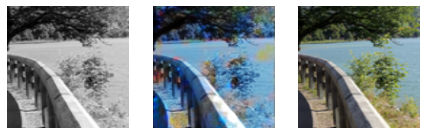

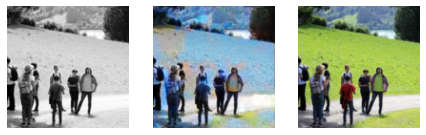

0.016088608652353287 1341
0.016872528940439224 1342
0.016084538772702217 1343
0.016405684873461723 1344
0.016972212120890617 1345
0.015429753810167313 1346
0.01613904908299446 1347
0.01630377769470215 1348
0.01656840555369854 1349
0.016112156212329865 1350


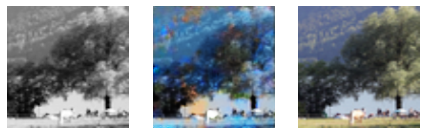

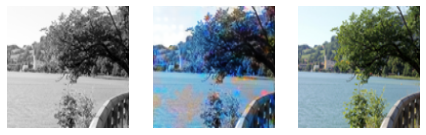

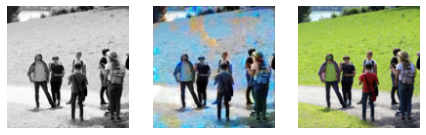

0.014913307502865791 1351
0.016670234501361847 1352
0.016713857650756836 1353
0.016178734600543976 1354
0.01614905521273613 1355
0.016760069876909256 1356
0.016089268028736115 1357
0.016416847705841064 1358
0.016492418944835663 1359
0.016112595796585083 1360


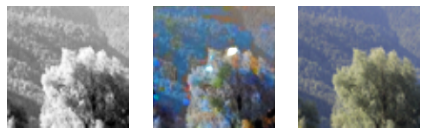

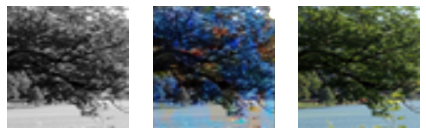

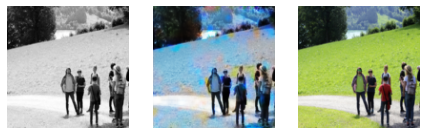

0.016540244221687317 1361
0.017301781103014946 1362
0.017064983025193214 1363
0.017443960532546043 1364
0.015775242820382118 1365
0.017160821706056595 1366
0.017094440758228302 1367
0.01575060747563839 1368
0.016523871570825577 1369
0.01736661046743393 1370


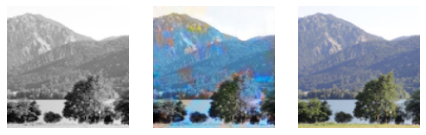

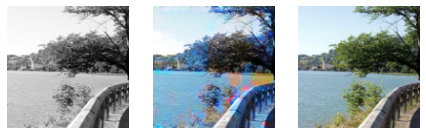

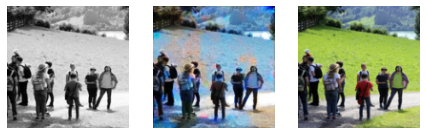

0.016429198905825615 1371
0.016213309019804 1372
0.016725663095712662 1373
0.016417833045125008 1374
0.01707923412322998 1375
0.02099556475877762 1376
0.015796417370438576 1377
0.01671764999628067 1378
0.01591656729578972 1379
0.015931734815239906 1380


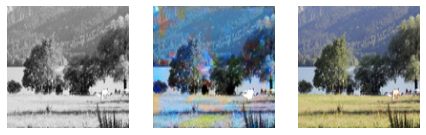

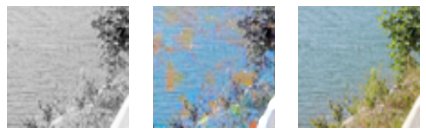

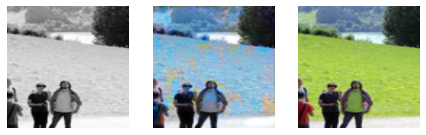

0.016939228400588036 1381
0.015633439645171165 1382
0.016256975010037422 1383
0.01681656390428543 1384
0.014773202128708363 1385
0.018616655841469765 1386
0.01736643724143505 1387
0.01598849892616272 1388
0.016790319234132767 1389
0.0157492533326149 1390


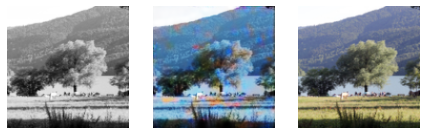

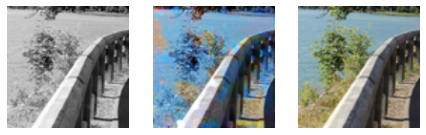

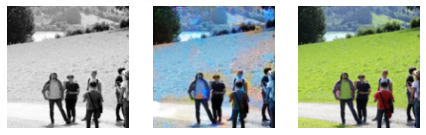

0.015692727640271187 1391
0.016408098861575127 1392
0.016226455569267273 1393
0.017248470336198807 1394
0.015094147063791752 1395
0.016775937750935555 1396
0.01704481616616249 1397
0.016838504001498222 1398
0.014706552028656006 1399
0.016029153019189835 1400


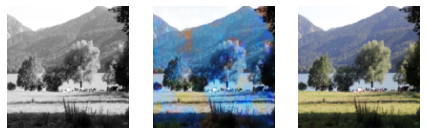

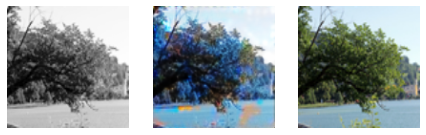

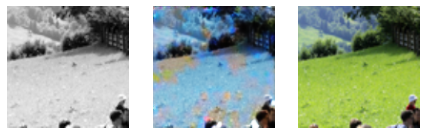

0.017362311482429504 1401
0.016308194026350975 1402
0.015541729517281055 1403
0.017442800104618073 1404
0.01873178221285343 1405
0.01671374961733818 1406
0.016489632427692413 1407
0.01683988608419895 1408
0.016784118488430977 1409
0.016745898872613907 1410


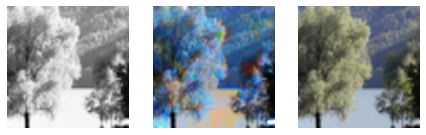

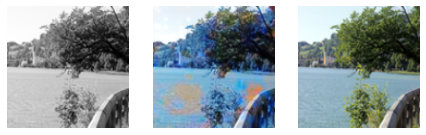

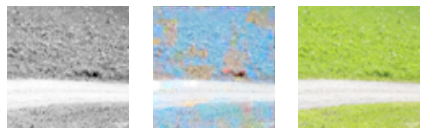

0.017319513484835625 1411
0.01627352274954319 1412
0.016594748944044113 1413
0.017730871215462685 1414
0.014986162073910236 1415
0.016441551968455315 1416
0.017989804968237877 1417
0.01787625253200531 1418
0.01571858488023281 1419
0.01599070616066456 1420


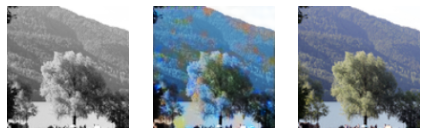

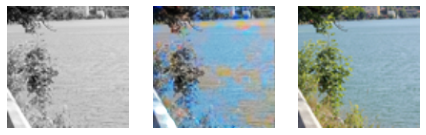

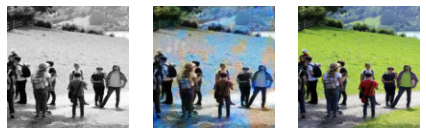

0.01764122024178505 1421
0.017104176804423332 1422
0.017053132876753807 1423
0.017807090654969215 1424
0.015658985823392868 1425
0.016976896673440933 1426
0.01812889240682125 1427
0.019365647807717323 1428
0.018016396090388298 1429
0.015494197607040405 1430


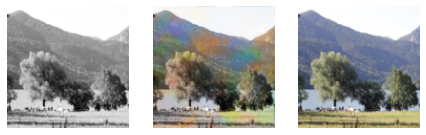

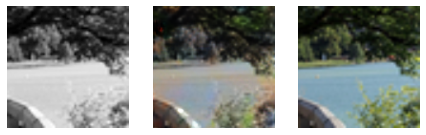

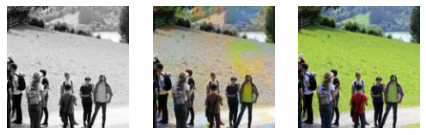

0.018385184928774834 1431
0.01653936505317688 1432
0.01680518127977848 1433
0.015116341412067413 1434
0.017669416964054108 1435
0.01702720671892166 1436
0.016635455191135406 1437
0.017508169636130333 1438
0.01714331842958927 1439
0.017381303012371063 1440


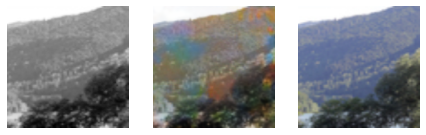

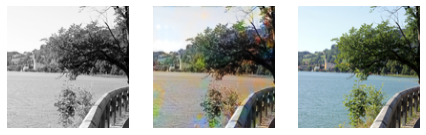

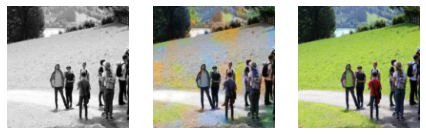

0.017196374014019966 1441
0.01667219214141369 1442
0.015926703810691833 1443
0.01641920953989029 1444
0.017042815685272217 1445
0.015806404873728752 1446
0.018367838114500046 1447
0.015461542643606663 1448
0.017070377245545387 1449
0.017122967168688774 1450


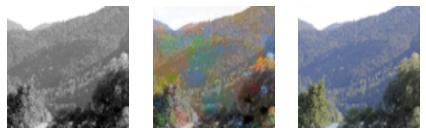

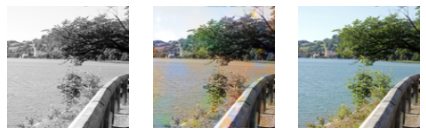

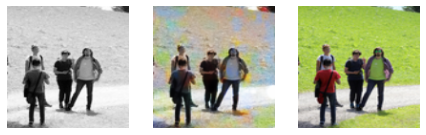

0.015788959339261055 1451
0.016648370772600174 1452
0.01788199692964554 1453
0.017742274329066277 1454
0.016575131565332413 1455
0.019352436065673828 1456
0.017741048708558083 1457
0.01891138032078743 1458
0.01630987972021103 1459
0.01690160669386387 1460


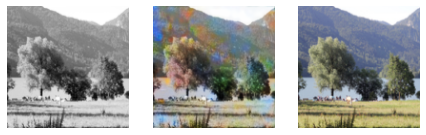

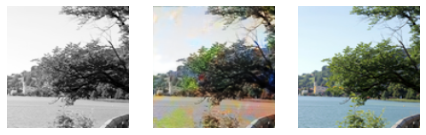

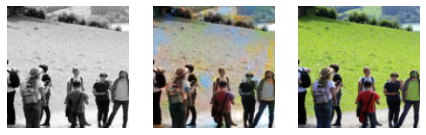

0.015256782993674278 1461
0.01702812686562538 1462
0.01592331752181053 1463
0.016390129923820496 1464
0.016961010172963142 1465
0.01474993396550417 1466
0.01786801777780056 1467
0.015774555504322052 1468
0.017671827226877213 1469
0.016350019723176956 1470


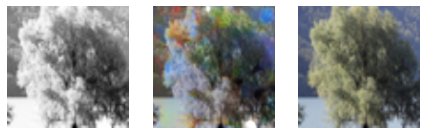

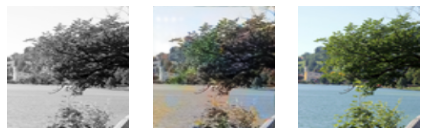

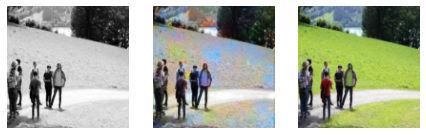

0.017075462266802788 1471
0.016562359407544136 1472
0.016678335145115852 1473
0.015693292021751404 1474
0.016213327646255493 1475
0.01706446148455143 1476
0.01688358373939991 1477
0.017289116978645325 1478
0.01860067993402481 1479
0.01597903110086918 1480


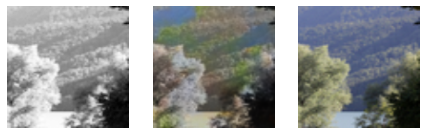

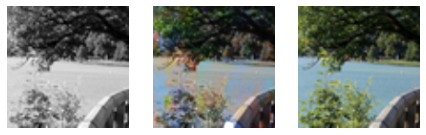

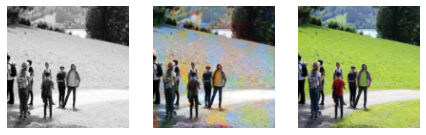

0.0162215493619442 1481
0.016212448477745056 1482
0.01624535396695137 1483
0.016845524311065674 1484
0.016655830666422844 1485
0.016415635123848915 1486
0.01627066545188427 1487
0.016281379386782646 1488
0.015839044004678726 1489
0.01676236093044281 1490


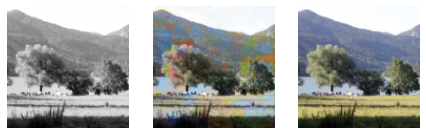

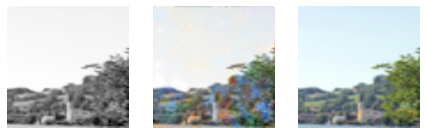

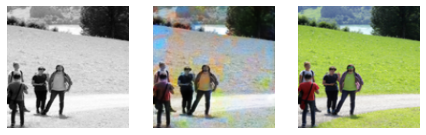

0.015060392208397388 1491
0.01576388254761696 1492
0.015967033803462982 1493
0.01600870117545128 1494
0.016841277480125427 1495
0.016132747754454613 1496
0.016762392595410347 1497
0.015519612468779087 1498
0.016138924285769463 1499
0.016386715695261955 1500


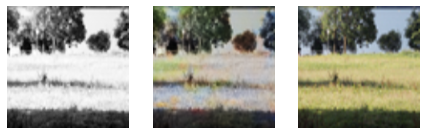

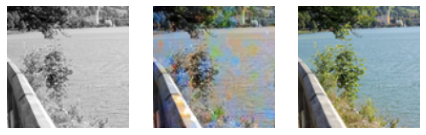

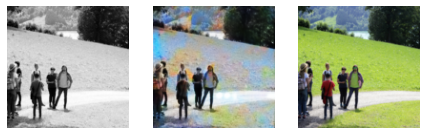

In [17]:
history = []
for epoch in range(1000, 1501):
    for x, y in loader:
        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        colorized = model(x)

        loss = criterion(colorized, y)
        
        history.append(loss.item())
        
        loss.backward()
        optimizer.step()
    print(history[-1], epoch)
        
        # теперь сами:
        # +0. распакавать данные на нужное устройство
        # +1. сбросить градиент
        # +2. прогнать данные через сеть
        # +3. посчитать loss
        # +4. залоггировать его куда-нибудь
        # 5. сделать .backward()
        # 6. optimizer.step()
        # (7. вывести пример колоризации -- см код ниже)
    if epoch % 10 == 0:
      for t in id:
        img_gray, img_true = dataset[t]
        img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
        img_pred = to_numpy_image(img_pred)
        # теперь это numpy-евский ndarray размера (128, 128, 3)
        plt.figure(figsize=(10,10))
        
        plt.subplot(141)
        plt.axis('off')
        plt.set_cmap('Greys')
        plt.imshow(img_gray.reshape((128, 128)))

        plt.subplot(142)
        plt.axis('off')
        plt.imshow(img_pred.reshape((128, 128, 3)))

        plt.subplot(143)
        plt.axis('off')
        plt.imshow(to_numpy_image(img_true))
        
        plt.show()

В подобных нечётко поставленных задачах важно смотреть не цифры, а на реальные примеры.


In [12]:
def to_numpy_image(img):
    # tl;dr: PyTorch хочет (3, 128, 128), а plt.imshow хочет (128, 128, 3)
    # есть два популярных формата для цветных картинок:
    #  1. где размерность, соответствующая каналам, идёт последней
    #  2. где размерность, соответствующая каналам, идёт первой
    # при работе с нейросетями удобен первый подход -- так запрашиваемая
    # при вычислениях память идёт последовательно, и из-за кэширования
    # операции свёртки работают быстрее
    # второй подход удобнее при уже работе с устройством, которое эти картинки показывает
    # -- удобно на три лампочки послать сразу три последовательно идущих байта
    return img.detach().cpu().view(3, 128, 128).transpose(0, 1).transpose(1, 2).numpy()

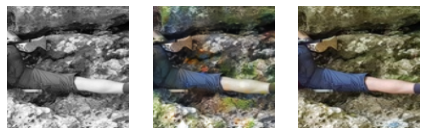

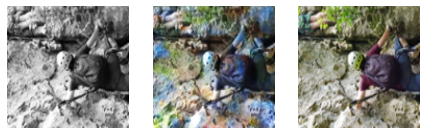

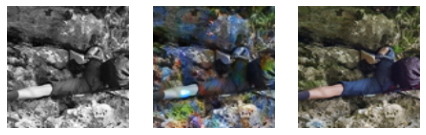

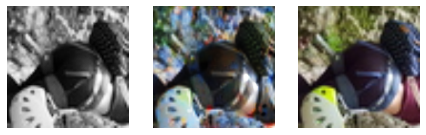

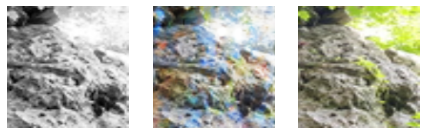

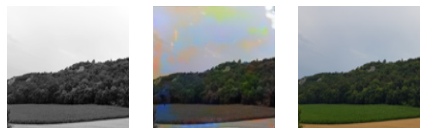

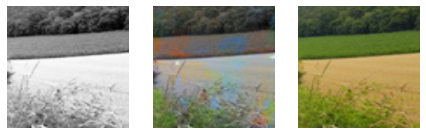

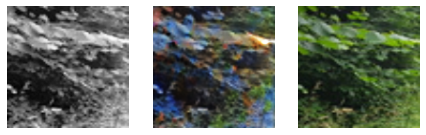

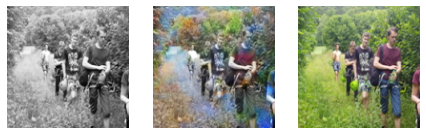

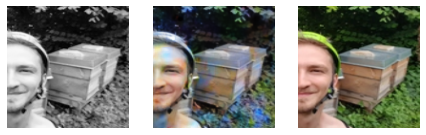

In [22]:
for t in range(400, 410):
    img_gray, img_true = dataset[t]
    img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
    img_pred = to_numpy_image(img_pred)
    # теперь это numpy-евский ndarray размера (128, 128, 3)
    plt.figure(figsize=(10,10))
    
    plt.subplot(141)
    plt.axis('off')
    plt.set_cmap('Greys')
    plt.imshow(img_gray.reshape((128, 128)))

    plt.subplot(142)
    plt.axis('off')
    plt.imshow(img_pred.reshape((128, 128, 3)))

    plt.subplot(143)
    plt.axis('off')
    plt.imshow(to_numpy_image(img_true))
    
    plt.show()

## *Тизер: adversarial loss

У нашего подхода к колоризации есть одна весьма существенная проблема: непонятно, как определять функцию потерь. Выясняется, что l1 или l2 в некоторых случаях даже являются принципиально неправильным выбором. Представьте, что у нас есть датасет фотографий с летнего лагеря, в котором все люди ходят в футболках двух разных цветов — например, красного и синего — интенсивность которых одинакова и неотличима на черно-белых версиях. Тогда наш лосс заставит сеть выбирать что-то «по середине» (в случае с l2 это будет среднее, а с l1 медиана), и, скорее всего, она сгенерирует что-то серое, в то время как она должна с какой-то вероятностью сгенерировать явно красную или явно синюю футболку.

Решение в следующем: выход (колоризованное изображение) кормить в другую сеть, которая учится определять «правдоподобность» раскраски. Помимо восстановления изображения с точки зрения какой-то меры близости, сети-генератору (колоризатору) нужно ещё и обмануть сеть-дискриминатор, а сети-дискриминатору нужно наоборот, учиться отличать настоящую колоризацию от нашей.

Подобные схемы с двумя состязяющимися сетями называют GAN-ам (Generative Adversarial Networks), о которых мы поговорим через занятие.